# **Proyecto Final**
## **Equipo 21**

Comenzamos cargando las librerías necesarias:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa
import glob
import math

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adamax, Adam
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, AveragePooling2D, MaxPooling2D

Importamos la información sobre nuestras imágenes que se encuentran en carpeta local descargadas del repositorio de Github con Github Desktop. Esto mediante la función de read_csv() de pandas.

In [2]:
#Definimos la ubicación del directorio con nuestras imágenes de entrenamiento
datadir = 'C:/Users/G/Documents/GitHub/NA_ProyectoFinal_Equipo_21/DATA2/'
#Obtenemos los subdirectorios dentro
list_folders = glob.glob(datadir + '*')

#Nombramos las columnas de los archivos .csv
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
#Generamos un dataframe vacio
data = pd.DataFrame()
#Por cada directorio, convertimos su .csv en un dataframe temporal, y lo unimos al ‘data’
for path in list_folders:
    data_temp = pd.read_csv(os.path.join(path, 'driving_log.csv'), names = columns)
    data = pd.concat([data,data_temp], ignore_index=True)

#Imprimimos la cantidad de registros y desplegamos los primeros 5
print('Cantidad de registros:',len(data.index))
data.head()

Cantidad de registros: 12535


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\G\Documents\TEC\Maestria\5 abril-juli...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,-0.247470,1.0,0.0,3.219350
1,C:\Users\G\Documents\TEC\Maestria\5 abril-juli...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,0.000000,1.0,0.0,4.386978
2,C:\Users\G\Documents\TEC\Maestria\5 abril-juli...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,-0.203272,1.0,0.0,5.543262
3,C:\Users\G\Documents\TEC\Maestria\5 abril-juli...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,-0.505929,1.0,0.0,6.657665
4,C:\Users\G\Documents\TEC\Maestria\5 abril-juli...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,C:\Users\G\Documents\TEC\Maestria\5 abril-jul...,-0.794444,1.0,0.0,7.924806


Separamos los paths de cada imagen para que solo incluyan el subdirectorio, el directorio ‘IMG’, y el nombre de la imagen. Se decidió usar las 3 cámaras de acuerdo al correo del profesor del día 21 de junio. Esto para al incluir mayor cantidad de imágenes relacionadas a curvas (cada imagen de cámara derecha o izquierda se importa con un ángulo de +-0.15), y así obtener mayor estabilidad en el modelo. 

In [3]:
#Función para dividir por ‘\’ y obtenemos las ultimas 3 divisiones:
def path_leaf(path):
    return '/'.join(path.split('\\')[-3:])

#Aplicamos la función a cada columna de los datos con paths de imágenes:
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,EXTRAS/IMG/center_2023_06_19_15_13_44_028.jpg,EXTRAS/IMG/left_2023_06_19_15_13_44_028.jpg,EXTRAS/IMG/right_2023_06_19_15_13_44_028.jpg,-0.247470,1.0,0.0,3.219350
1,EXTRAS/IMG/center_2023_06_19_15_13_44_133.jpg,EXTRAS/IMG/left_2023_06_19_15_13_44_133.jpg,EXTRAS/IMG/right_2023_06_19_15_13_44_133.jpg,0.000000,1.0,0.0,4.386978
2,EXTRAS/IMG/center_2023_06_19_15_13_44_235.jpg,EXTRAS/IMG/left_2023_06_19_15_13_44_235.jpg,EXTRAS/IMG/right_2023_06_19_15_13_44_235.jpg,-0.203272,1.0,0.0,5.543262
3,EXTRAS/IMG/center_2023_06_19_15_13_44_335.jpg,EXTRAS/IMG/left_2023_06_19_15_13_44_335.jpg,EXTRAS/IMG/right_2023_06_19_15_13_44_335.jpg,-0.505929,1.0,0.0,6.657665
4,EXTRAS/IMG/center_2023_06_19_15_13_44_438.jpg,EXTRAS/IMG/left_2023_06_19_15_13_44_438.jpg,EXTRAS/IMG/right_2023_06_19_15_13_44_438.jpg,-0.794444,1.0,0.0,7.924806


Ahora generamos una función para extraer del dataframe los paths de las imágenes, así como su valor de steering. Para terminar con numpy arrays que tengan todos los valores de los paths, así como sus respectivos valores de steering.

In [4]:
#Declaramos la función
def load_img_steering(datadir, df):
    #lista para almacenar los paths
    image_path = []
    #lista para almacenar steering
    steering = []
    #Iteramos por todos los datos
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        # agregamos imagen central
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # agregamos imagen izquierda
        image_path.append(os.path.join(datadir,left.strip()))
        steering.append(float(indexed_data[3])+0.15)
        # agregamos imagen derecha
        image_path.append(os.path.join(datadir,right.strip()))
        steering.append(float(indexed_data[3])-0.15)             
        
    #convertimos listas a numpy arrays
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    #regresamos los arrays
    return image_paths, steerings

#aplicamos la función en los datos
image_paths, steerings = load_img_steering(datadir, data)

Generamos una función para girar 180 grados las imágenes, así como invertir su valor de steering:

In [5]:
def img_flip(image, steering_angle):
    image = cv2.flip(image,1) #cv2 para flip
    steering_angle = -steering_angle #invertimos el ángulo
    return image, steering_angle

Aplicamos la función img_flip() a todas las imágenes que no tengan un valor de steering 0 para su imagen central. Dado que cada imagen de la cámara derecha o izquierda previamente le asignamos un valor de +-0.15 dependiendo de su valor de steering de la imagen central, omitimos invertir las imágenes de left y right cuando la imagen de la cámara central tiene un valor de steering igual a 0. Ya que su inverso ya existe en la cámara contraria a ella. 

Una vez generadas las imágenes, las grabamos en la carpeta del directorio con un nuevo path que incluya ‘_flipped’ en su nombre. Seguido, guardamos su path y su nuevo valor de steering. Y convertirnos a numpy array para trabajar los datos de las nuevas imágenes.

In [6]:
#Convertimos a listas 
image_paths_temp = list(image_paths)
steerings_temp = list(steerings)

#Iteramos por todos los paths de las imágenes
for i in range(len(image_paths)):
    #Obtenemos su path
    img_path = image_paths_temp[i]
    #Observamos que, si no son la central, la central sea diferente a 0
    #Así como que, si es la central, que su valor sea diferente a 0
    if '\left' in img_path:
        k = i - 1
    elif '\right' in img_path:
        k = i - 2
    else:
        k = i
    if steerings_temp[i] != 0 and steerings_temp[k] != 0:
        #Leemos la imagen
        img = mpimg.imread(img_path)
        #Aplicamos la función para invertirla
        img, new_steering = img_flip(img,steerings_temp[i])
        #Generamos el nuevo path
        new_path = img_path[:-4]+'_flipped'+img_path[-4:]
        #La guardamos localmente en el nuevo path
        mpimg.imsave(new_path,img)
        #Agregamos a sus listas correspondientes
        image_paths_temp.append(new_path); steerings_temp.append(new_steering)

#Convertimos las listas en dataframe
data = pd.DataFrame({'path':image_paths_temp,'steering':steerings_temp})

Es conveniente segmentar los datos para que, en su distribución de imágenes, las imágenes con valores de steering de mayor frecuencia no sesguen al modelo. Generando un histograma para ver su distribución, también podemos observar las que tienen frecuencias más altas. Por lo que, observando la gráfica, limitamos a 3200 datos cada segmento:

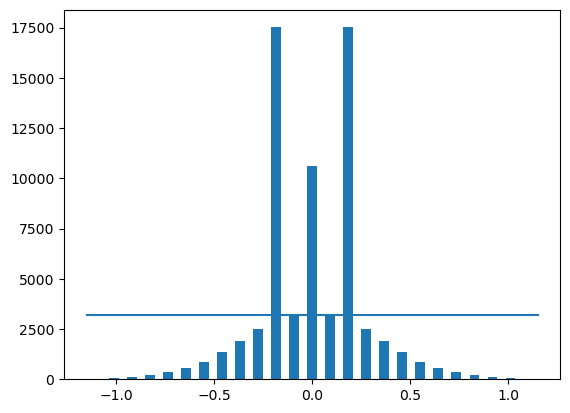

In [7]:
#Separamos los datos por bins
num_bins = 25
#Definimos la cantidad máxima de datos que queremos por bin
samples_per_bin = 3200

#Generamos un histograma para visualizar
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, 
                                                                samples_per_bin))

Limitamos cada segmento a 3200 datos. Esto iterando por cada bin previamente definido, seleccionando los datos que corresponden a este último, y limitándolos al límite máximo de 3200 previamente definido.

total data: 67789
removed: 36041
remaining: 31748


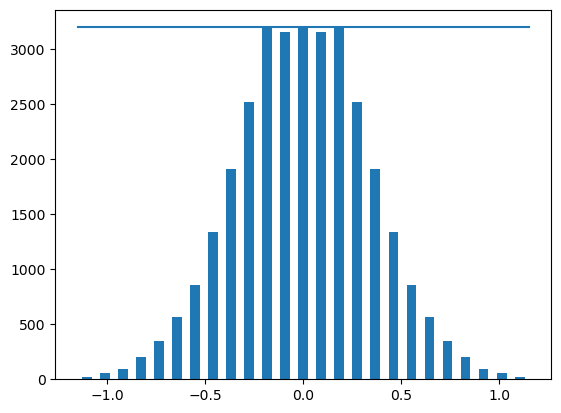

In [8]:
#Imprimimos el total de datos original
print('total data:', len(data))
#Lista para los índices que se eliminaran
remove_list = []
#iteramos por cada bin
for j in range(num_bins):
    #Lista temporal para almacenar los datos a eliminar por bin
    list_ = []
    #Iteramos por todos los datos de steering:
    for i in range(len(data['steering'])):
        #si su valor esta en el bin a trabajar, se agrega a la lista
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    #Aplicamos un shuffle
    list_ = shuffle(list_)
    #Aislamos los datos extras al valor máximo
    list_ = list_[samples_per_bin:]
    #Agregamos a una lista que tendrá los datos a eliminar
    remove_list.extend(list_)

#Imprimimos la cantidad de datos a remover
print('removed:', len(remove_list))
#Los eliminamos del dataframe original
data.drop(data.index[remove_list], inplace=True)
#Imprimimos la cantidad de datos restantes
print('remaining:', len(data))

#Graficamos los bins con los datos restantes
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, 
                                                                samples_per_bin))

Ahora, donde tenemos un dataframe con todos los paths de las imágenes en una sola columna, generamos una función obtener como arrays los paths y sus valores de steering. 

In [9]:
def load_img_steering(datadir, df):
    image_path = [] #lista para almacenar los paths
    steering = [] #lista para almacenar steering
    #Iteramos por todos los datos
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center = indexed_data[0]
        #agregamos a su respectiva lista
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[1]))
     #convertimos listas a numpy arrays
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

#aplicamos la función en los datos
image_paths, steerings = load_img_steering(datadir, data)

Ahora segmentamos los datos en entrenamiento y validación. Donde dejaremos para validación un 20% de los datos. 

In [18]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, 
                                                      test_size=0.2, random_state=4)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 25398
Valid Samples: 6350


Importante graficar para visualizar la distribución de datos a los segmentos de validación y prueba. Podemos iterar en el la partición aleatoria hasta asegurarnos de tener una distribución de campana aceptable en las dos particiones. 

Text(0.5, 1.0, 'Validation set')

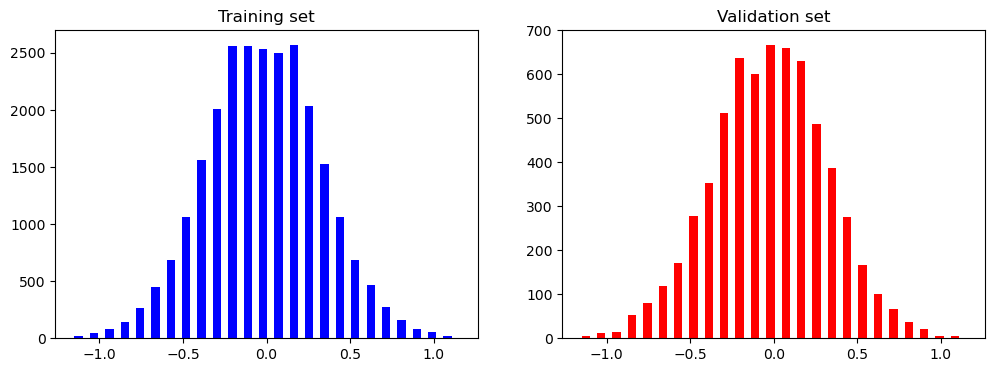

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Parte de la generación del modelo, previo al entrenamiento, es la data augmentation. Generar imágenes con variaciones aleatorias pueden ayudar al modelo a aprender a generalizar mejor. Lo cual terminara preparándolo a comportarse correctamente con datos de entrada nuevos. 

Comenzamos con la siguiente función de zoom. La cual aplicaremos para variar la escala de las imágenes:

Text(0.5, 1.0, 'Zoomed Image')

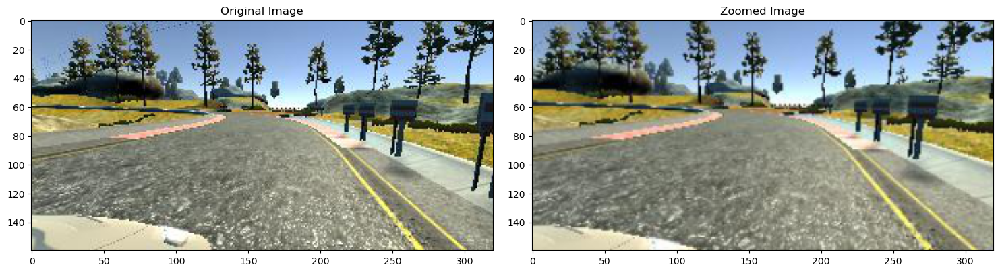

In [20]:
def zoom(image): #declaramos
    #definimos posibles rangos
    zoom = iaa.Affine(scale=(1, 1.15))
    #aplicamos
    image = zoom.augment_image(image)
    return image

#obtenemos una imagen aleatoria para desplegar 
#original vs. modificada con la función
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Generamos la función de pan para trasladar en sus ejes las imágenes y darles enfoque diferente:

Text(0.5, 1.0, 'Panned Image')

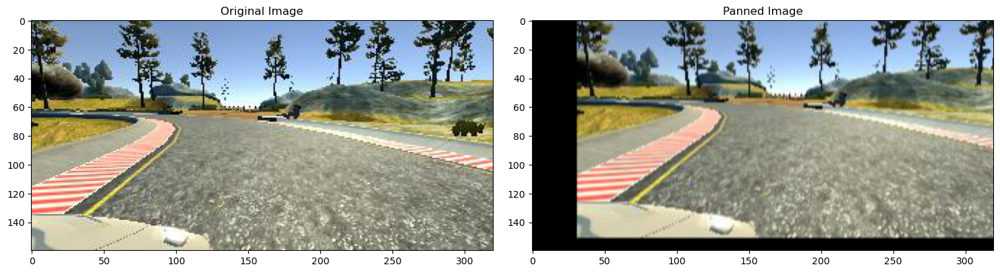

In [21]:
def pan(image): #declaramos
    #Definimos rangos en los dos ejes
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    #Aplicamos 
    image = pan.augment_image(image)
    return image

#obtenemos una imagen aleatoria para desplegar 
#original vs. modificada con la función
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Ahora generamos una función que varie el brillo de las imágenes:

Text(0.5, 1.0, 'Brightness altered image ')

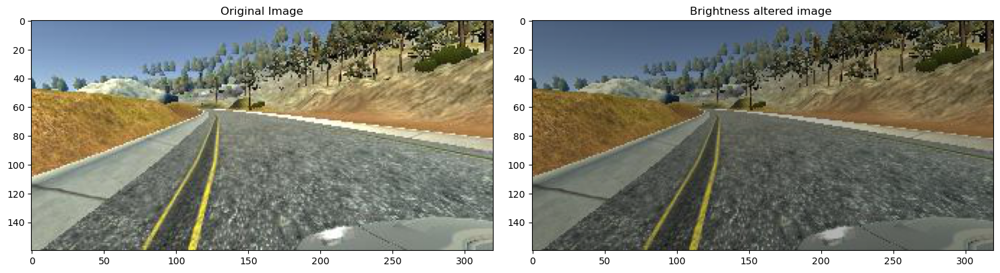

In [44]:
def img_random_brightness(image):#declaramos
    #Definimos rangos 
    brightness = iaa.Multiply((0.25, 1))
    #aplicamos
    image = brightness.augment_image(image)
    return image

#obtenemos una imagen aleatoria para desplegar 
#original vs. modificada con la función
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Seguido, generamos una función que varie el brillo de las imágenes. Pero únicamente un segmento aleatorio que divida en vertical. Esto para simular que el carro está cruzando el umbral de luz del día, a una sombra.

Text(0.5, 1.0, 'Brightness altered image ')

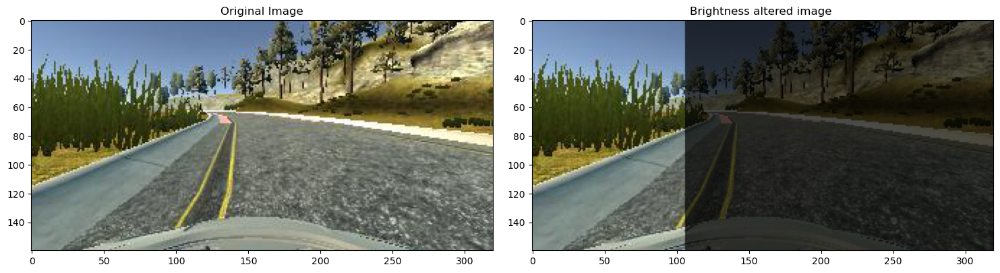

In [45]:
def img_random_brightness_split_v(img):
    #Obtenemos dimensiones
    h, w, channels = img.shape
    #Generamos rango aleatorio
    rand = random.randint(2,6)
    width_cutoff = w // rand
    #Definimos de qué trabajaremos
    if np.random.rand() < 0.5:
        width_cutoff = w - width_cutoff
    #Segmentamos las imágenes
    s1 = img[:, :width_cutoff]
    s2 = img[:, width_cutoff:]
    #Definimos valor que bajaremos brillo
    brightness = iaa.Multiply(0.3)
    #Aplicamos la sombra a uno de los lados
    if np.random.rand() < 0.5:
        s1 = brightness.augment_image(s1)
    else:
        s2 = brightness.augment_image(s2)
    #Juntamos las imágenes seccionadas
    img = cv2.hconcat([s1, s2])
    return img

#obtenemos una imagen aleatoria para desplegar 
#original vs. modificada con la función
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness_split_v(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Ahora, generamos una función que varie el brillo de las imágenes. Pero únicamente un segmento aleatorio, dentro del lado bajo de la imagen (por lo que seccionaremos como área de interés más adelante en preprocesamiento de la imagen) que divida en horizontal. Esto para simular que el carro está cruzando el umbral de luz del día, a una sombra; o de una sombra a luz del día.

Text(0.5, 1.0, 'Brightness altered image ')

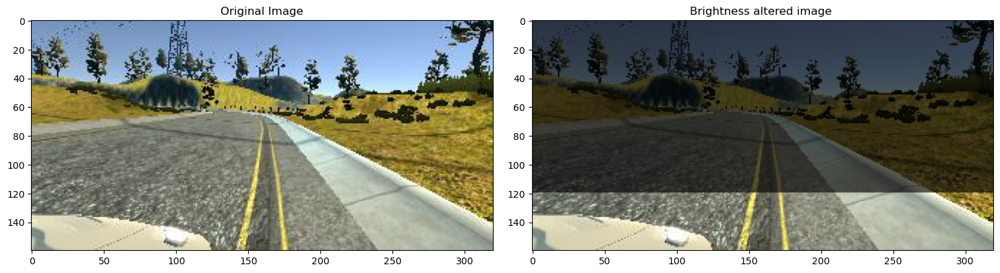

In [46]:
def img_random_brightness_split_h(img):
    #Obtenemos dimensiones
    h, w, channels = img.shape
    #Generamos rango aleatorio
    rand = random.randint(3,10)
    #Definimos la sección donde haremos el corte
    half2 = h//rand
    if rand%2 == 0:
        mult = random.randint(rand/2+1,rand-1)
    else:
        mult = random.randint(math.ceil(rand/2),rand-1)
    #Seccionamos la imagen
    top = img[:half2*mult, :]
    bottom = img[half2*mult:, :]
    #Definimos un rango aleatorio de sombra
    brightness = iaa.Multiply((0.25,0.4))
    #Aplicamos a uno de los dos lados
    if np.random.rand() < 0.5:
        top = brightness.augment_image(top)
    else:
        bottom = brightness.augment_image(bottom)
    #Juntamos las imágenes
    img = cv2.vconcat([top, bottom])
    return img

#obtenemos una imagen aleatoria para desplegar 
#original vs. modificada con la función
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness_split_h(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Finalmente, generamos una función que aplique de manera aleatoria las 3 posibles modificaciones (solo debe aplicarse 1 de las que modifican el brillo a la vez, no queremos segmentos con doble sombra) que tenemos para nuestras imágenes. Así mismo, mostramos 10 ejemplos de su aplicación:

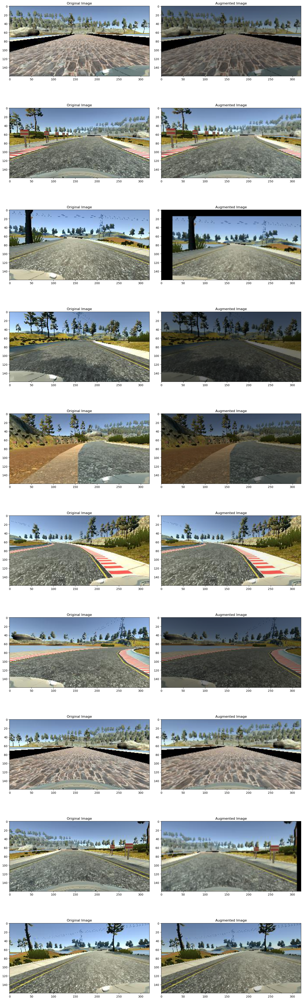

In [47]:
def random_augment(image, steering_angle): #declaramos
    #leemos la imagen
    image = mpimg.imread(image)
    #definimos un numero aleatorio decidir si aplicar cada función
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    rand = np.random.rand()
    if rand < 0.75:
        image = img_random_brightness(image)
    elif rand > 9/10:
        if np.random.rand() < 0.5:
            image = img_random_brightness_split_h(image)
        else:
            image = img_random_brightness_split_v(image)
    return image, steering_angle

#Graficamos las imágenes
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(nrow):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)
    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

Ocupamos aplicarle preprocesamiento de imagen a cada imagen para adaptarlas a la entrada de nuestro modelo. Al trabajar el proyecto, nos dimos cuenta que en la pista dos del simulador, el modelo tenía problemas para detectar los bordes entre pavimento y montaña al encontrarse en la sombra. Y que, en vez de detectar ese borde, detectaba los postes de los letreros como carriles, lo que ocasionaba una colisión. Nuestra manera de solucionarlo, fue aplicando un sharpen a la imagen, y aumentando el brillo. Logrando así que se detectara el borde deseado. Y al aplicar un blur previo y después del sharpen, se logró la detección del borde sobre la del poste. Así mismo, al considerar que los colores son muy diferentes en la pista 1 comparados contra la pista 2. Para la solución especifica de este proyecto se decidió cambiar las imágenes a escala de grises. 

Teniendo en cuenta lo anterior, generamos una función y desplegamos un ejemplo de su aplicación:

Text(0.5, 1.0, 'Preprocessed Image')

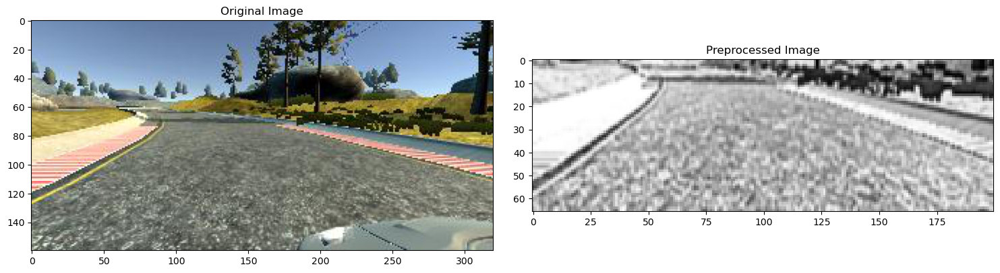

In [48]:
def img_preprocess(img):
    img = img[60:135,:,:] #Segmentamos
    img = cv2.GaussianBlur(img, (3, 3), 0) #Aplicamos blur
    #definimos sharpen y brillo
    aug = iaa.Sharpen(alpha=(1), lightness=(1.5))
    img = aug.augment_image(img) #aplicamos sharpen y brillo
    #convertimos a escala de grises
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img = cv2.GaussianBlur(img, (3, 3), 0) #aplicamos blur
    img = cv2.resize(img, (200, 66)) #redimensionamos a 200x66
    img = img/255 #normalizamos
    img = tf.convert_to_tensor(img) #convertimos a tensor
    return img

#Obtenemos imagen original y la preprocesada
image = image_paths[2000]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

#Visualizamos
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image, cmap='gray')
axs[1].set_title('Preprocessed Image')

Al entrenar nuestro modelo, es necesario usar batches de datos, en este caso de imágenes. Por lo que generamos una función para generar los batches de imágenes con los que se estará entrenando, así como si se les aplicara la función de data augmentation o no:

In [49]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
    while True:
        batch_img =[]  #Lista para guardar imágenes
        batch_steering = [] #Lista para valores de steering

        for i in range(batch_size):
            #Índice de la imagen
            random_index = random.randint(0, len(image_paths) - 1)
            #Si es de entrenamiento, pasa por random_augment
            if istraining:
                im, steering = random_augment(image_paths[random_index], 
                                              steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = img_preprocess(im) #Preprocesamos la imagen
            #Agregamos a listas
            batch_img.append(im)
            batch_steering.append(steering)
            
        #Regresamos las listas como numpy arrays
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Ejemplificamos el uso de nuestro batch_generator con un batch de 1 imagen:

Text(0.5, 1.0, 'Validation Image')

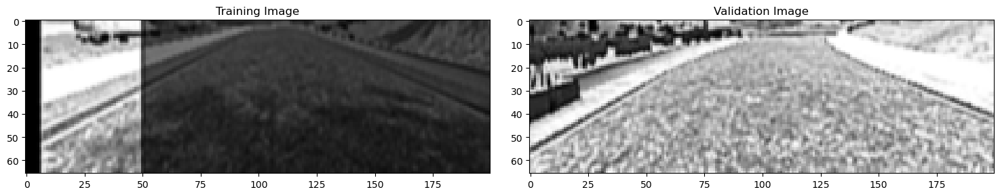

In [169]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0], cmap='gray')
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0], cmap='gray')
axs[1].set_title('Validation Image')

Declaramos una función para definir nuestro modelo a utilizar. El cual esta basado en el modelo publicado por nvidia. Con la única diferencia de que se modifico el valor de Dropout a 0.25:

In [170]:
def nvidia_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(filters = 24, kernel_size = (5, 5), strides=(2, 2), 
                                     input_shape=(66, 200, 1), activation='elu'))
    model.add(tf.keras.layers.Conv2D(filters = 36, kernel_size = (5, 5), strides=(2, 2), 
                                     activation='elu'))
    model.add(tf.keras.layers.Conv2D(filters = 48, kernel_size = (5, 5), strides=(2, 2), 
                                     activation='elu'))
    model.add(tf.keras.layers.Conv2D(filters = 64, kernel_size = (3, 3), 
                                     activation='elu'))

    model.add(tf.keras.layers.Convolution2D(filters = 64, kernel_size = (3, 3), 
                                            activation='elu'))
    model.add(tf.keras.layers.Dropout(0.25))

    model.add(tf.keras.layers.Flatten())

    model.add(tf.keras.layers.Dense(100, activation = 'elu'))

    model.add(tf.keras.layers.Dense(50, activation = 'elu'))

    model.add(tf.keras.layers.Dense(10, activation = 'elu'))

    model.add(tf.keras.layers.Dense(1))

    optimizer = Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

Definimos el modelo, y vemos su resumen:

In [171]:
model = nvidia_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        624       
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 dropout (Dropout)           (None, 1, 18, 64)         0         
                                                                 
 flatten (Flatten)           (None, 1152)              0

Generamos una función para definir los steps per epoch en el entrenamiento. Donde buscamos que el batch_size multiplicado por los steps_per_epoch sea equivalente a la cantidad de imágenes a trabajar:

In [172]:
def calculate_spe(y):
    return int(math.ceil((1. * y) / batch_size))

Declaramos cuantas imágenes tendrá cada batch. Valor numérico que se encontró a prueba y error; considerando que entre menor suele tender a generalizar mejor. 

In [173]:
batch_size = 64

Entrenamos nuestro modelo, donde para los datos de entrenamiento y validación aplicamos nuestra funcion batch_generator(). Así como la funcion calculate_spe() para los steps_per_epoch. 

In [174]:
history = model.fit(batch_generator(X_train, y_train, batch_size, 1),
                              steps_per_epoch=calculate_spe(len(X_train)),
                              epochs=30,
                              validation_data=batch_generator(X_valid, y_valid, 
                                                              batch_size, 0),
                              validation_steps= calculate_spe(len(X_valid)),
                              verbose=1,
                              shuffle = 1)

Epoch 1/30
397/397 [==============================] - 109s 262ms/step - loss: 0.1086 - val_loss: 0.0845
Epoch 2/30
397/397 [==============================] - 103s 261ms/step - loss: 0.0795 - val_loss: 0.0642
Epoch 3/30
397/397 [==============================] - 104s 263ms/step - loss: 0.0708 - val_loss: 0.0535
Epoch 4/30
397/397 [==============================] - 103s 260ms/step - loss: 0.0662 - val_loss: 0.0558
Epoch 5/30
397/397 [==============================] - 103s 260ms/step - loss: 0.0636 - val_loss: 0.0561
Epoch 6/30
397/397 [==============================] - 103s 260ms/step - loss: 0.0610 - val_loss: 0.0540
Epoch 7/30
397/397 [==============================] - 103s 260ms/step - loss: 0.0597 - val_loss: 0.0466
Epoch 8/30
397/397 [==============================] - 103s 259ms/step - loss: 0.0580 - val_loss: 0.0506
Epoch 9/30
397/397 [==============================] - 101s 254ms/step - loss: 0.0556 - val_loss: 0.0460
Epoch 10/30
397/397 [==============================] - 103s 259m

Observamos que nuestra perdida en validación termino siendo 3.4%, lo cual es un valor aceptable. Seguido graficamos su perdida vs. época:

Text(0.5, 0, 'Epoch')

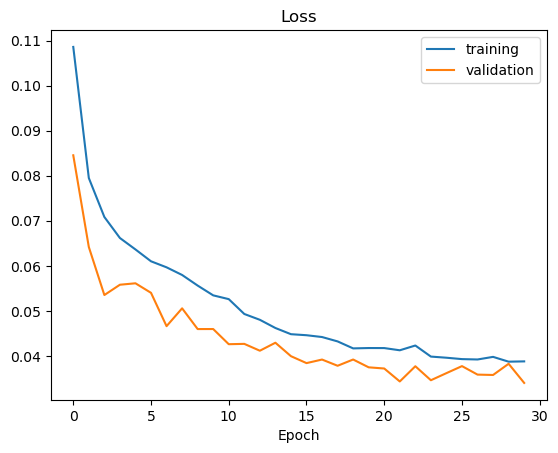

In [177]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

Guardamos localmente nuestro modelo:

In [178]:
model.save('C:/Users/G/Documents/GitHub/NA_ProyectoFinal_Equipo_21/model_14.h5')

Ahora buscamos utilizarlo en el simulador, por lo que comenzamos cargando librerías:

In [1]:
import socketio
import eventlet
import numpy as np
from flask import Flask
import base64
from io import BytesIO
from PIL import Image
import cv2
from imgaug import augmenters as iaa

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model, load_model

Aplicamos el código ejemplo para la conexión de modelo con simulador. Comenzamos definiendo el preprocesamiento de imagen, así como nuestra máxima velocidad:

In [11]:
sio = socketio.Server()

app = Flask(__name__) #'__main__'
speed_limit = 20
#aplicamos nuestro preprocesamiento de imagen
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.GaussianBlur(img, (3, 3), 0)
    aug = iaa.Sharpen(alpha=(1), lightness=(1.5))
    img = aug.augment_image(img)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Seguido usamos el mismo codigo que el modelo, con la diferencia que generamos una ventana con cv2 para visualizar lo que recibe el modelo:

In [12]:
@sio.on('telemetry')
def telemetry(sid, data):
    #print(np.asarray(Image.open(BytesIO(base64.b64decode(data['image'])))))
    speed = float(data['speed'])
    image = Image.open(BytesIO(base64.b64decode(data['image'])))
    image = np.asarray(image)
    image = img_preprocess(image)
    cv2.imshow('car view',image) #desplegamos lo que ve el modelo
    cv2.waitKey(1)
    #cv2.destroyAllWindows()
    image = np.array([image])
    steering_angle = float(model.predict(image,verbose = 0))
    throttle = 1.0 - speed/speed_limit
    #print('{} {} {}'.format(steering_angle, throttle, speed))
    send_control(steering_angle, throttle)

Funciones para la conexión:

In [13]:
@sio.on('connect')
def connect(sid, environ):
    print('Connected')
    send_control(0, 0)

def send_control(steering_angle, throttle):
    sio.emit('steer', data = {
        'steering_angle': steering_angle.__str__(),
        'throttle': throttle.__str__()
    })

Cargamos el modelo, aplicamos las funciones anteriores, y generamos la conexión:

In [14]:
if __name__ == '__main__':
    model = load_model('C:/Users/G/Documents/GitHub/NA_ProyectoFinal_Equipo_21/model_14.h5')
    app = socketio.Middleware(sio, app)
    eventlet.wsgi.server(eventlet.listen(('', 4567)), app)

(14740) wsgi starting up on http://0.0.0.0:4567
(14740) accepted ('127.0.0.1', 50169)


Connected


(14740) accepted ('127.0.0.1', 50188)


Connected


127.0.0.1 - - [22/Jun/2023 18:44:43] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 357.936462
wsgi exiting
127.0.0.1 - - [22/Jun/2023 18:49:39] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 349.212639
(14740) wsgi exited, is_accepting=True


Cerramos la ventana de opencv:

In [15]:
cv2.destroyAllWindows()